# try to get coherent, error-free signal from igram stack

In [7]:
# Import required packages
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.collections as mc
from datetime import datetime, timedelta
import xarray as xr
import rasterio as rio
import rioxarray
import geopandas as gpd
import time
import os

In [8]:
ds_fn = 'AT151_ds.nc'
data_path = '/Users/qbren/Desktop/taco/projects/rmnp_rockslide/summer_ints/data'
ds = xr.open_dataset(f'{data_path}/{ds_fn}')

In [9]:
# add timedelta
delta_list = []
for date in ds['dates'].values:
    delta_list.append((datetime.strptime(date[9:17], '%Y%m%d')-datetime.strptime(date[0:8], '%Y%m%d')).days)
    
ds['tbaseline'] = (('dates'), delta_list)

In [10]:
# function to find value of new reference point in each time slice and subtract it from data array
rref_list = []

def change_ref(ds, lat, lon):
    reref = ds.copy(deep=True)
    for i in range(ds.sizes['dates']):
        # get value from grid
        rref_list.append(float(ds.isel(dates=i).unw_phase.sel(x=lon, y=lat, method='nearest').values))
    reref['unw_phase'] = ds['unw_phase'] - xr.DataArray(rref_list, dims='dates')
    return reref 

In [ ]:
# ds = change_ref(ds, 40.302141, -105.685762)

In [11]:
# fix velocity 
veloc = (((ds['unw_phase']*0.05546576/12.5663706)/ds['tbaseline'])*365).values
ds['veloc'] = (('dates', 'y', 'x'), veloc.data)

C:\Users\qbren\AppData\Local\Temp\ipykernel_18468\1057888256.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, ax = plt.subplots()


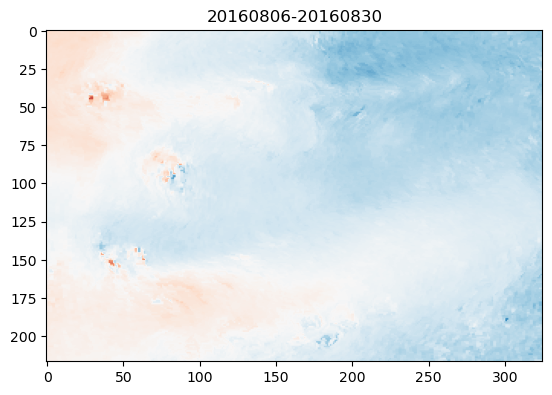

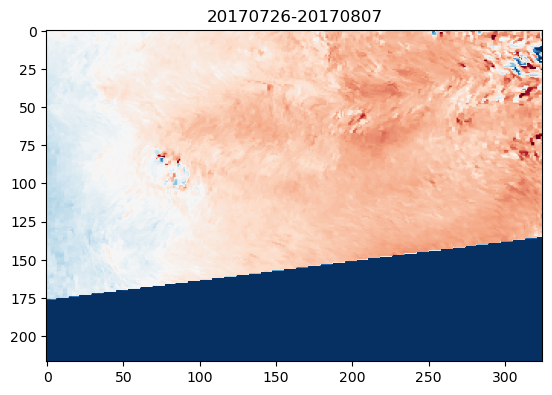

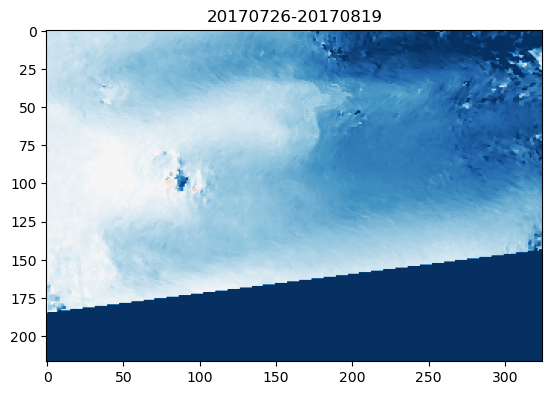

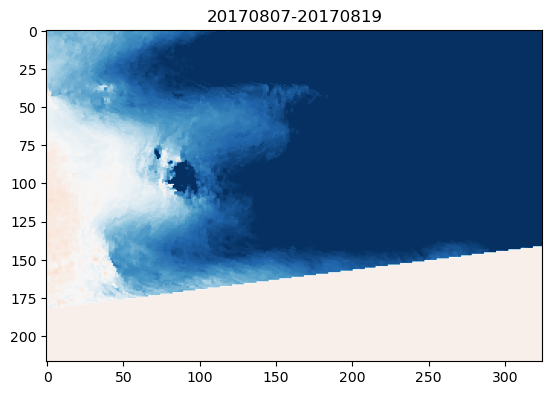

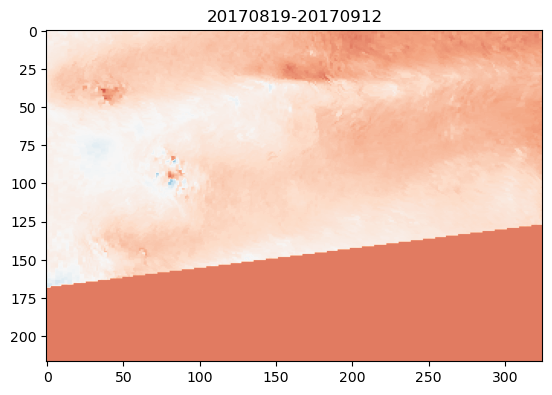

...

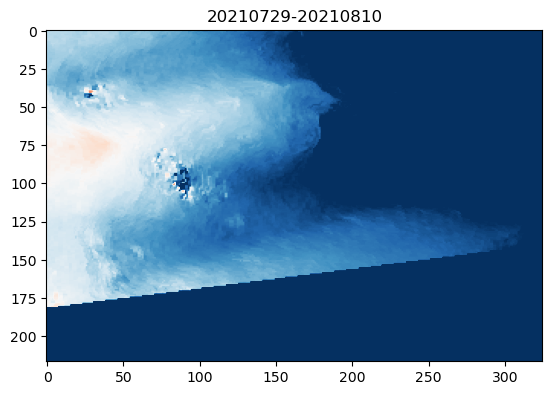

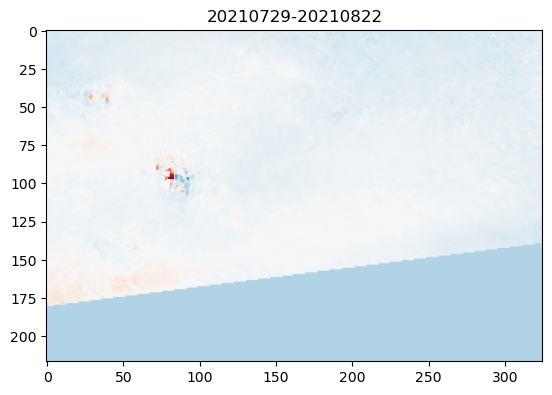

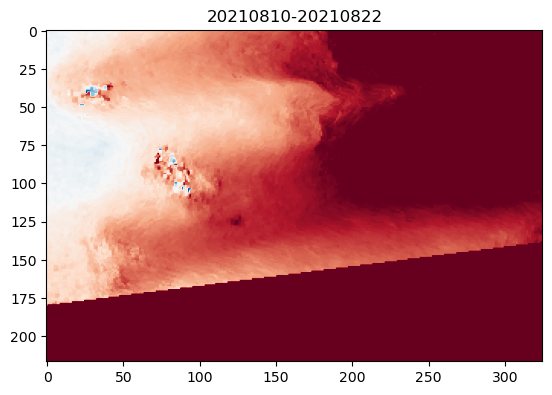

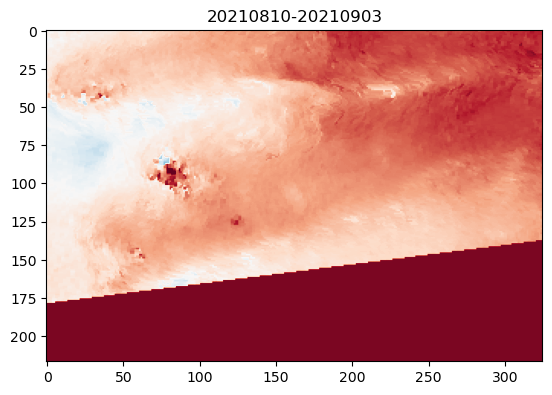

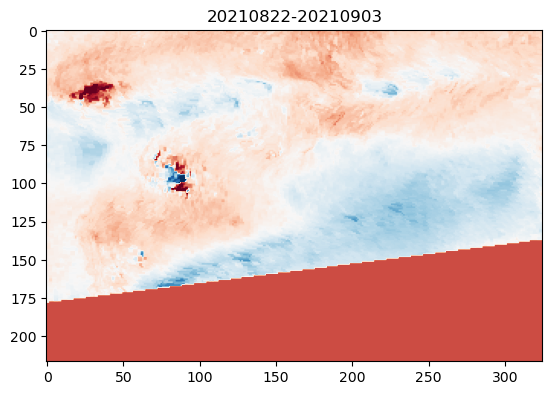

In [12]:
# examine images
for i, date in enumerate(ds.dates.to_numpy()):
    f, ax = plt.subplots()
    ax.imshow(ds.veloc.isel(dates=i), cmap='RdBu_r', vmin=-0.4, vmax=0.4)
    ax.set_title(date)

In [ ]:
# load json of aoi area
aoi_area_fn = '/Users/qbren/Desktop/taco/projects/rmnp_rockslide/shapefiles/Chaos_DEMs_deliniation/Outline_Landslide_wgs.shp'
aoi_area_gdf = gpd.read_file(aoi_area_fn)

# load json of landslide aoi
aoi_fn = '/Users/qbren/Desktop/taco/projects/rmnp_rockslide/shapefiles/Chaos_DEMs_deliniation/Erosion_v5_wgs.shp'
aoi_gdf = gpd.read_file(aoi_fn)

In [ ]:
# limit to short baselines
ds_sb = ds.sel(dates=ds.tbaseline < 25)

In [ ]:
# clip to aoi
ds_aoi_area = ds_sb.rio.clip(aoi_area_gdf.geometry, crs=aoi_area_gdf.crs, drop=False)

In [ ]:
ds_high_coh = ds_sb.sel(dates=ds_aoi_area.coherence.median(dim=('x', 'y')) > 0.6)

In [ ]:
f, ax = plt.subplots(3, 1, figsize=(10, 10))
ax[0].imshow(ds_high_coh['veloc'].where(ds['coherence'] > 0.4).median(dim='dates'),
         cmap='RdBu', vmin=-0.4, vmax=0.4)
ax[1].imshow(ds_high_coh['veloc'].where(ds['coherence'] > 0.4).count(dim='dates'), cmap='Blues', vmax=len(ds_high_coh.dates.values))
f.tight_layout()
ax[2].imshow(ds_high_coh['veloc'].where(ds['coherence'] > 0.4).std(dim='dates'), cmap='Blues', vmax=0.5)
f.tight_layout()

## alternative approach: looking at coherence

In [ ]:
# remove date missing data over feature
ds_sb = ds_sb.sel(dates=ds_aoi_area.coherence.median(dim=('x', 'y')) > 0.01)

In [ ]:
f, ax = plt.subplots(2, 1, figsize=(10, 10))
ax[0].imshow(ds_sb['coherence'].median(dim='dates'),
         cmap='Blues', vmin=0, vmax=1)
f.tight_layout()
ax[1].imshow(ds_sb['coherence'].std(dim='dates'), cmap='Blues', vmax=1)
f.tight_layout()

## stats

In [ ]:
ds_aoi = ds_sb.rio.clip(aoi_gdf.geometry, crs=aoi_gdf.crs, drop=False)

In [ ]:
ds_aoi.coherence.median(dim=('x', 'y', 'dates')).values

In [ ]:
ds_aoi.coherence.std(dim=('x', 'y', 'dates')).values

## save rasters

In [ ]:
os.chdir('/Users/qbren/Desktop/taco/projects/rmnp_rockslide/summer_ints/')

In [ ]:
# veloc
#ds_high_coh['veloc'].where(ds['coherence'] > 0.4).median(dim='dates').rio.to_raster('DT56_veloc.tif')

In [ ]:
# coherence
#ds['coherence'].median(dim='dates').rio.to_raster('DT56_coherence.tif')

In [ ]:
# std veloc
#ds_high_coh['veloc'].where(ds['coherence'] > 0.4).std(dim='dates').rio.to_raster('DT56_veloc_std.tif')

## temporal baseline figure

In [ ]:
def toYearFraction(date):
    def sinceEpoch(date): # returns seconds since epoch
        return time.mktime(date.timetuple())
    s = sinceEpoch

    year = date.year
    startOfThisYear = datetime(year=year, month=1, day=1)
    startOfNextYear = datetime(year=year+1, month=1, day=1)

    yearElapsed = s(date) - s(startOfThisYear)
    yearDuration = s(startOfNextYear) - s(startOfThisYear)
    fraction = yearElapsed/yearDuration

    return date.year + fraction

In [ ]:
# limit to short baselines
ds_sb = ds.sel(dates=ds.tbaseline < 25)

In [ ]:
ds_sb

In [ ]:
lines = []
for i, date in enumerate(ds_sb['dates'].values):
    lines.append([(toYearFraction(datetime.strptime(date[0:8], '%Y%m%d')), i), (toYearFraction(datetime.strptime(date[9:17], '%Y%m%d')), i)])

In [ ]:
lc = mc.LineCollection(lines, linewidths=3)

plt.style.use('ggplot')
f, ax = plt.subplots(figsize=(4.5, 3))
ax.add_collection(lc)
ax.margins(0.1)
ax.set_ylabel('index')

#plt.savefig('tbline_AT78.png', dpi=300)

## Wrapped phase

In [14]:
ds_fn = 'AT151_ds_wrapped.nc'
data_path = '/Users/qbren/Desktop/taco/projects/rmnp_rockslide/summer_ints/data'
ds = xr.open_dataset(f'{data_path}/{ds_fn}')

C:\Users\qbren\AppData\Local\Temp\ipykernel_18468\591288024.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, ax = plt.subplots()


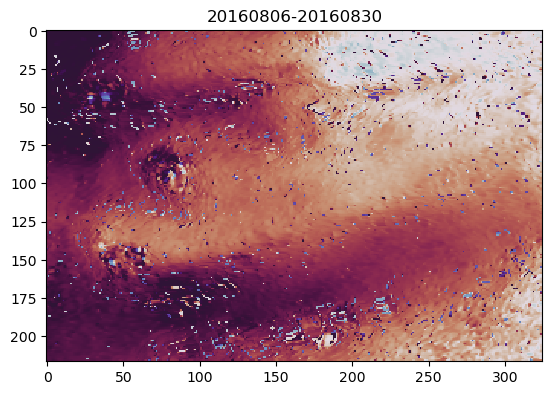

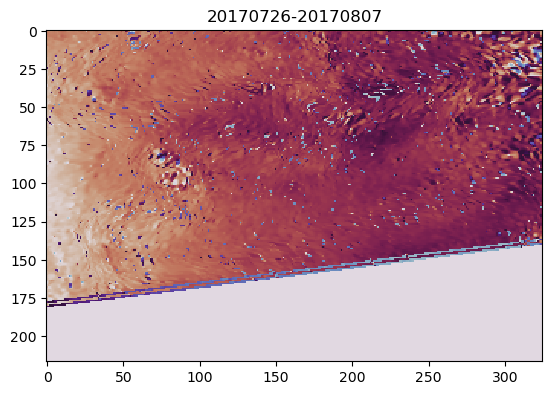

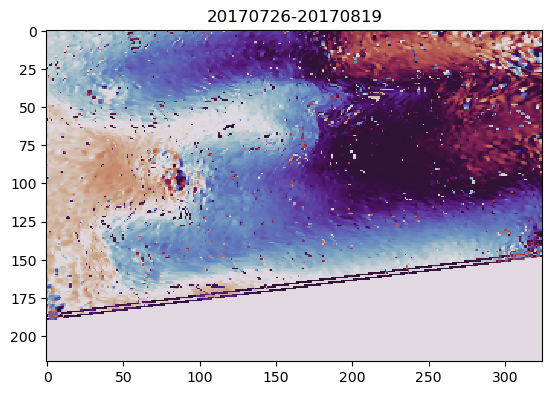

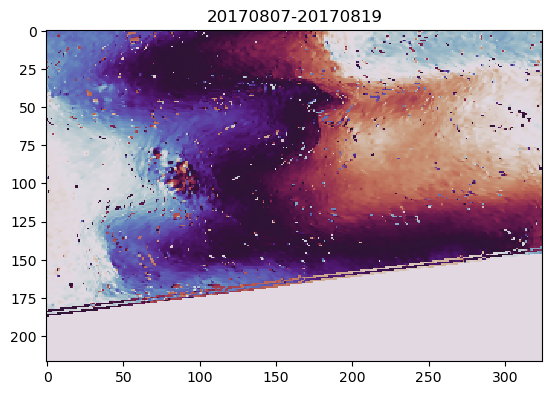

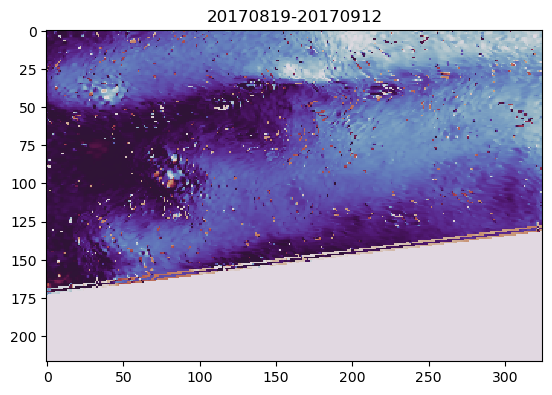

...

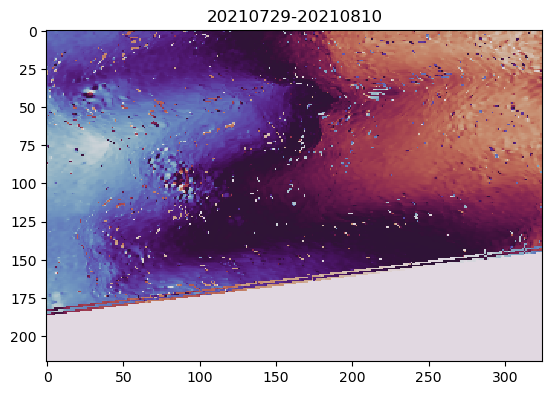

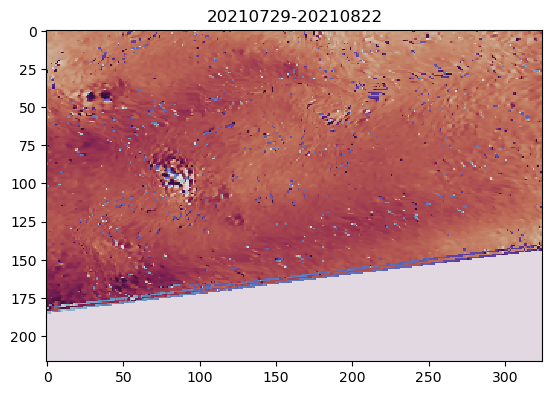

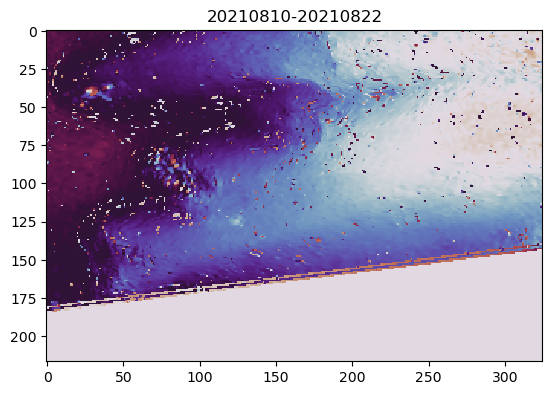

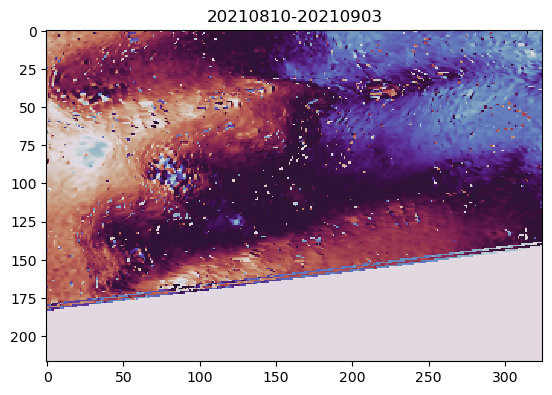

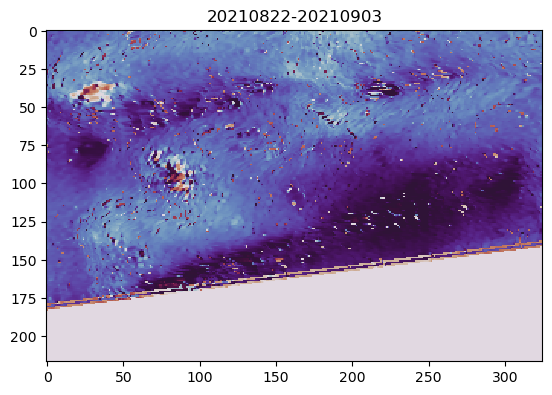

In [20]:
# examine images
for i, date in enumerate(ds.dates.to_numpy()):
    f, ax = plt.subplots()
    ax.imshow(ds.phase.isel(dates=i), cmap='twilight_shifted', vmin=-3, vmax=3, interpolation='none')
    ax.set_title(date)

In [18]:
# std veloc
ds.phase.sel(dates='20180826-20180907').rio.to_raster('AT151_20180826-20180907_wrapped.tif')